# Onnx model 

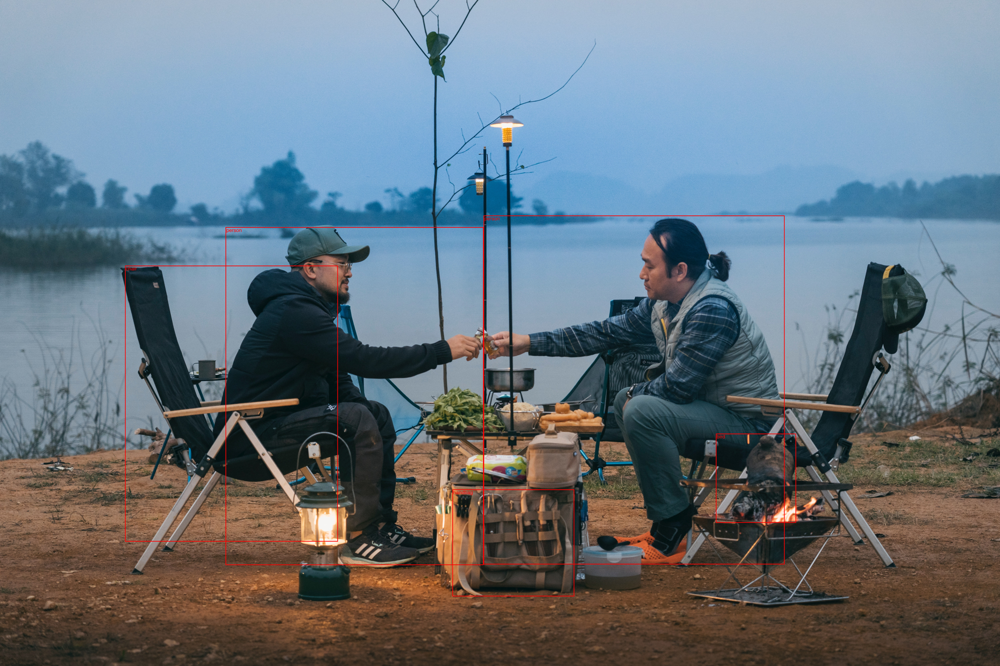

In [3]:
from torchvision.io.image import decode_image
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection import ssdlite320_mobilenet_v3_large, SSDLite320_MobileNet_V3_Large_Weights
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn, FasterRCNN_MobileNet_V3_Large_320_FPN_Weights
from torchvision.models.detection import fcos_resnet50_fpn, FCOS_ResNet50_FPN_Weights
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_pil_image

# img = decode_image("pexels-jeffrey-czum-2346165.jpg")
img = decode_image("pexels-lam-kiên-15008127.jpg")

thresh=0.50

# Step 1: Initialize model with the best available weights
# weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
# model = fasterrcnn_resnet50_fpn_v2(weights=weights, box_score_thresh=0.9)
# weights = SSDLite320_MobileNet_V3_Large_Weights.DEFAULT
# model = ssdlite320_mobilenet_v3_large(weights=weights, box_score_thresh=0.99)
# weights = FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.DEFAULT
# model = fasterrcnn_mobilenet_v3_large_320_fpn(weights=weights, box_score_thresh=0.9)

weights = FCOS_ResNet50_FPN_Weights.DEFAULT
model = fcos_resnet50_fpn(weights=weights, box_score_thress=0.99)
model.eval()


# Step 2: Initialize the inference transforms
preprocess = weights.transforms()

# Step 3: Apply inference preprocessing transforms
batch = [preprocess(img)]

# Step 4: Use the model and visualize the prediction
prediction = model.forward(batch)[0]
prediction = {
    k: prediction[k][prediction['scores']>thresh] for k in prediction
}

labels = [weights.meta["categories"][i] for i in prediction["labels"]]
box = draw_bounding_boxes(img, boxes=prediction["boxes"],
                          labels=labels,
                          colors="red",
                          width=4, font="Helvetica.ttf", font_size=30)
im = to_pil_image(box.detach())
im.resize([i//3 for i in im.size])


In [2]:
img.shape, batch[0].shape, model.transform(batch)[0].tensors.shape

(torch.Size([3, 4000, 6000]),
 torch.Size([3, 4000, 6000]),
 torch.Size([1, 3, 800, 1216]))

In [17]:
torch_input = torch.randn(1, 1, 1000,1000)
export_options = torch.onnx.ExportOptions(dynamic_shapes=True)
onnx_program = torch.onnx.dynamo_export(model, torch_input, export_options=export_options)


/home/raka/Projects/InferenceOptimization/.env/lib/python3.10/site-packages/torch/onnx/_internal/_exporter_legacy.py:116: UserWarning: torch.onnx.dynamo_export only implements opset version 18 for now. If you need to use a different opset version, please register them with register_custom_op.
  warnings.warn(


OnnxExporterError: Failed to export the model to ONNX. Generating SARIF report at 'report_dynamo_export.sarif'. SARIF is a standard format for the output of static analysis tools. SARIF logs can be loaded in VS Code SARIF viewer extension, or SARIF web viewer (https://microsoft.github.io/sarif-web-component/). Please report a bug on PyTorch Github: https://github.com/pytorch/pytorch/issues

In [6]:
import onnxruntime as ort
import numpy as np

# Load the ONNX model
session = ort.InferenceSession("model.onnx", provider_options=['CPUExecutionProvider'])

# Prepare input data (e.g., variable-size image tensor)
# Ensure the input shape matches the dynamic axes specified during export
# input_data = np.random.randn(1, 3, 224, 224).astype(np.float32)  # Replace with actual data
input_data = np.array(batch) 

# Get the names of the input and output layers
input_name = session.get_inputs()[0].name
output_names = [out.name for out in session.get_outputs()]

# Run the model with ONNX Runtime
output = session.run(output_names, {input_name: input_data})

# Output will be a list with the result of the model inference
print("Model output:", output)


Model output: [array([[1353.1042 , 1364.3027 , 2901.915  , 3393.948  ],
       [2901.1895 , 1294.5579 , 4707.424  , 3389.1465 ],
       [ 750.9296 , 1595.4474 , 2027.87   , 3252.3218 ],
       [2714.3435 , 2939.4688 , 3445.8623 , 3581.4854 ],
       [4295.0215 , 2604.9058 , 4776.7153 , 3139.126  ],
       [3155.046  , 2598.7983 , 3489.105  , 2938.9744 ],
       [4315.9453 , 2613.8438 , 4806.974  , 3140.5417 ],
       [3231.7983 , 2465.7385 , 3596.6929 , 2562.4658 ],
       [4145.8833 , 2322.4688 , 5352.701  , 3595.8396 ],
       [4108.9067 , 2622.483  , 5059.245  , 3601.9165 ],
       [4315.9453 , 2613.8438 , 4806.974  , 3140.5417 ],
       [3230.112  , 2475.4023 , 3610.853  , 2605.3193 ],
       [4048.257  , 2643.22   , 4312.9683 , 3392.935  ],
       [ 803.78754, 2043.4377 , 2182.7202 , 3551.2695 ],
       [4821.762  , 1572.2793 , 5564.6865 , 2880.968  ],
       [2697.666  , 2936.4702 , 3448.2043 , 3578.9695 ],
       [4117.769  , 2629.0452 , 5055.074  , 3608.6748 ],
       [ 841.289

In [9]:
prediction.keys()

dict_keys(['boxes', 'scores', 'labels'])

In [10]:
onnx_preds = { 
    'boxes': output[0],
    'scores': output[1], 
    'labels': output[2], 
}

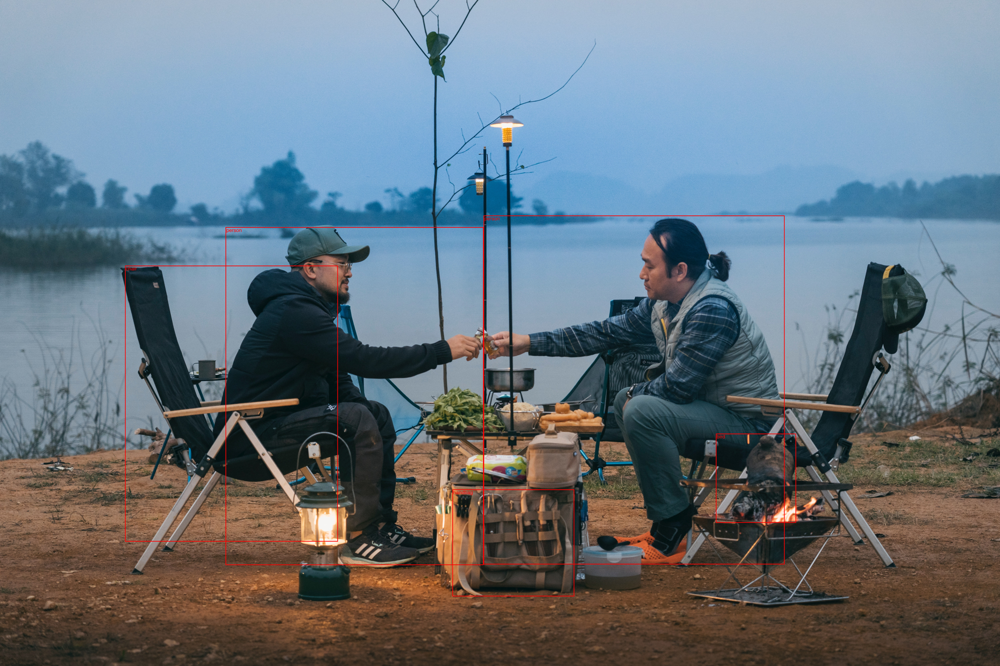

In [12]:
import torch
onnx_prediction = {
    k: onnx_preds[k][onnx_preds['scores']>thresh] for k in onnx_preds
}

labels = [weights.meta["categories"][i] for i in onnx_prediction["labels"]]
box = draw_bounding_boxes(img, boxes= torch.from_numpy(onnx_prediction["boxes"]),
                          labels=labels,
                          colors="red",
                          width=4, font="Helvetica.ttf", font_size=30)
im = to_pil_image(box.detach())
im.resize([i//3 for i in im.size])

# Reimplementations

In [11]:
from torchvision.io.image import decode_image
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection import ssdlite320_mobilenet_v3_large, SSDLite320_MobileNet_V3_Large_Weights
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn, FasterRCNN_MobileNet_V3_Large_320_FPN_Weights
from torchvision.models.detection import fcos_resnet50_fpn, FCOS_ResNet50_FPN_Weights
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_pil_image

# img = decode_image("pexels-jeffrey-czum-2346165.jpg")
img = decode_image("pexels-lam-kiên-15008127.jpg")

thresh=0.50

# Step 1: Initialize model with the best available weights
# weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
# model = fasterrcnn_resnet50_fpn_v2(weights=weights, box_score_thresh=0.9)
# weights = SSDLite320_MobileNet_V3_Large_Weights.DEFAULT
# model = ssdlite320_mobilenet_v3_large(weights=weights, box_score_thresh=0.99)
# weights = FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.DEFAULT
# model = fasterrcnn_mobilenet_v3_large_320_fpn(weights=weights, box_score_thresh=0.9)

# weights = FCOS_ResNet50_FPN_Weights.DEFAULT
# model = fcos_resnet50_fpn(weights=weights, box_score_thress=0.99)
# model.eval()


# Step 2: Initialize the inference transforms
preprocess = weights.transforms()

# Step 3: Apply inference preprocessing transforms
batch = [preprocess(img)]

# Step 4: Use the model and visualize the prediction
prediction = model.forward(batch)[0]
prediction = {
    k: prediction[k][prediction['scores']>thresh] for k in prediction
}

labels = [weights.meta["categories"][i] for i in prediction["labels"]]
box = draw_bounding_boxes(img, boxes=prediction["boxes"],
                          labels=labels,
                          colors="red",
                          width=4, font="Helvetica.ttf", font_size=30)
im = to_pil_image(box.detach())
im.resize([i//3 for i in im.size])


TypeError: forward() missing 1 required positional argument: 'images'

In [105]:
model(batch)[0]

{'boxes': tensor([[1353.1040, 1364.3025, 2901.9146, 3393.9478],
         [2901.1899, 1294.5581, 4707.4243, 3389.1467],
         [ 750.9299, 1595.4478, 2027.8700, 3252.3223],
         [2714.3435, 2939.4688, 3445.8628, 3581.4846],
         [4295.0215, 2604.9053, 4776.7153, 3139.1260],
         [3155.0461, 2598.7983, 3489.1050, 2938.9744],
         [4315.9453, 2613.8438, 4806.9746, 3140.5420],
         [3231.7988, 2465.7388, 3596.6929, 2562.4658],
         [4145.8833, 2322.4692, 5352.7012, 3595.8396],
         [4108.9072, 2622.4827, 5059.2451, 3601.9165],
         [4315.9453, 2613.8438, 4806.9746, 3140.5420],
         [3230.1121, 2475.4026, 3610.8525, 2605.3193],
         [4048.2571, 2643.2200, 4312.9683, 3392.9351],
         [ 803.7877, 2043.4377, 2182.7200, 3551.2693],
         [4821.7622, 1572.2792, 5564.6870, 2880.9688],
         [2697.6663, 2936.4702, 3448.2043, 3578.9695],
         [4117.7686, 2629.0452, 5055.0737, 3608.6746],
         [ 841.2900, 1411.4224, 2684.6838, 3455.7107],
 

In [2]:
orig_forward = model.forward

In [9]:
def forward(
    self,
    images: List[Tensor],
    targets: Optional[List[Dict[str, Tensor]]] = None,
) -> Tuple[Dict[str, Tensor], List[Dict[str, Tensor]]]:
    """
    Args:
        images (list[Tensor]): images to be processed
        targets (list[Dict[Tensor]]): ground-truth boxes present in the image (optional)

    Returns:
        result (list[BoxList] or dict[Tensor]): the output from the model.
            During training, it returns a dict[Tensor] which contains the losses.
            During testing, it returns list[BoxList] contains additional fields
            like `scores`, `labels` and `mask` (for Mask R-CNN models).
    """
    if self.training:

        if targets is None:
            torch._assert(False, "targets should not be none when in training mode")
        else:
            for target in targets:
                boxes = target["boxes"]
                torch._assert(isinstance(boxes, torch.Tensor), "Expected target boxes to be of type Tensor.")
                torch._assert(
                    len(boxes.shape) == 2 and boxes.shape[-1] == 4,
                    f"Expected target boxes to be a tensor of shape [N, 4], got {boxes.shape}.",
                )

    original_image_sizes: List[Tuple[int, int]] = []
    for img in images:
        val = img.shape[-2:]
        torch._assert(
            len(val) == 2,
            f"expecting the last two dimensions of the Tensor to be H and W instead got {img.shape[-2:]}",
        )
        original_image_sizes.append((val[0], val[1]))

    # transform the input
    images, targets = self.transform(images, targets)

    # Check for degenerate boxes
    if targets is not None:
        for target_idx, target in enumerate(targets):
            boxes = target["boxes"]
            degenerate_boxes = boxes[:, 2:] <= boxes[:, :2]
            if degenerate_boxes.any():
                # print the first degenerate box
                bb_idx = torch.where(degenerate_boxes.any(dim=1))[0][0]
                degen_bb: List[float] = boxes[bb_idx].tolist()
                torch._assert(
                    False,
                    f"All bounding boxes should have positive height and width. Found invalid box {degen_bb} for target at index {target_idx}.",
                )

    # get the features from the backbone
    features = self.backbone(images.tensors)
    if isinstance(features, torch.Tensor):
        features = OrderedDict([("0", features)])

    features = list(features.values())

    # compute the fcos heads outputs using the features
    head_outputs = self.head(features)

    # create the set of anchors
    anchors = self.anchor_generator(images, features)
    # recover level sizes
    num_anchors_per_level = [x.size(2) * x.size(3) for x in features]

    losses = {}
    detections: List[Dict[str, Tensor]] = []
    if self.training:
        if targets is None:
            torch._assert(False, "targets should not be none when in training mode")
        else:
            # compute the losses
            losses = self.compute_loss(targets, head_outputs, anchors, num_anchors_per_level)
    else:
        # split outputs per level
        split_head_outputs: Dict[str, List[Tensor]] = {}
        for k in head_outputs:
            split_head_outputs[k] = list(head_outputs[k].split(num_anchors_per_level, dim=1))
        split_anchors = [list(a.split(num_anchors_per_level)) for a in anchors]

        # compute the detections
        detections = self.postprocess_detections(split_head_outputs, split_anchors, images.image_sizes)
        detections = self.transform.postprocess(detections, images.image_sizes, original_image_sizes)

    if torch.jit.is_scripting():
        if not self._has_warned:
            warnings.warn("FCOS always returns a (Losses, Detections) tuple in scripting")
            self._has_warned = True
        return losses, detections
    return self.eager_outputs(losses, detections)
model.forward = forward

NameError: name 'List' is not defined

# Prev implementation

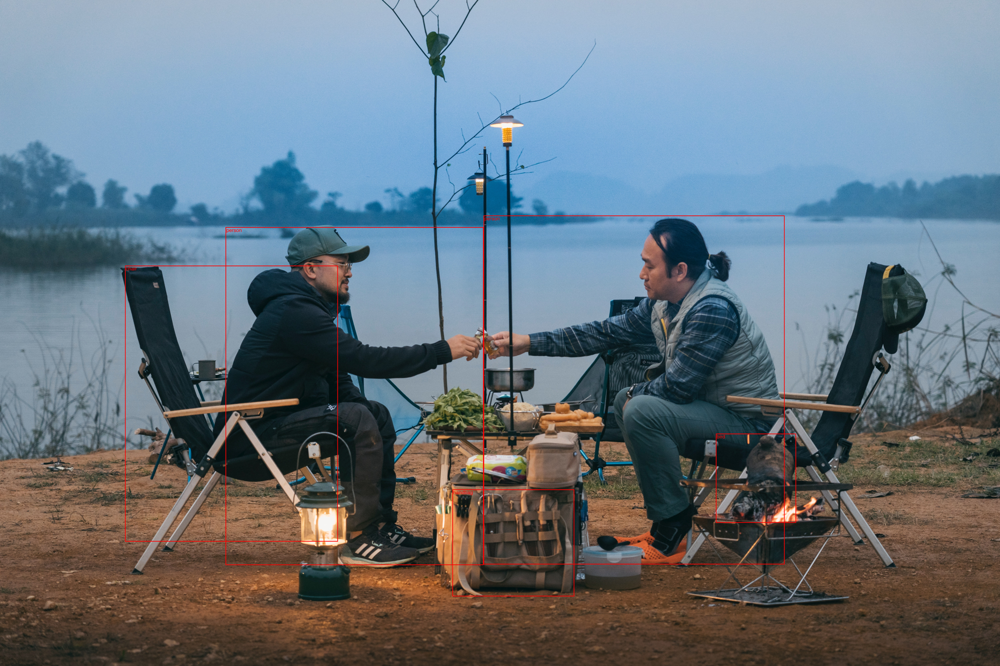

In [61]:
from torchvision.io.image import decode_image
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection import ssdlite320_mobilenet_v3_large, SSDLite320_MobileNet_V3_Large_Weights
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn, FasterRCNN_MobileNet_V3_Large_320_FPN_Weights
from torchvision.models.detection import fcos_resnet50_fpn, FCOS_ResNet50_FPN_Weights
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_pil_image

# img = decode_image("pexels-jeffrey-czum-2346165.jpg")
img = decode_image("pexels-lam-kiên-15008127.jpg")

thresh=0.50

# Step 1: Initialize model with the best available weights
# weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
# model = fasterrcnn_resnet50_fpn_v2(weights=weights, box_score_thresh=0.9)
# weights = SSDLite320_MobileNet_V3_Large_Weights.DEFAULT
# model = ssdlite320_mobilenet_v3_large(weights=weights, box_score_thresh=0.99)
# weights = FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.DEFAULT
# model = fasterrcnn_mobilenet_v3_large_320_fpn(weights=weights, box_score_thresh=0.9)
weights = FCOS_ResNet50_FPN_Weights.DEFAULT
model = fcos_resnet50_fpn(weights=weights, box_score_thress=0.99)
model.eval()


# Step 2: Initialize the inference transforms
preprocess = weights.transforms()

# Step 3: Apply inference preprocessing transforms
batch = [preprocess(img)]

# Step 4: Use the model and visualize the prediction
prediction = model(batch)[0]
prediction = {
    k: prediction[k][prediction['scores']>thresh] for k in prediction
}

labels = [weights.meta["categories"][i] for i in prediction["labels"]]
box = draw_bounding_boxes(img, boxes=prediction["boxes"],
                          labels=labels,
                          colors="red",
                          width=4, font="Helvetica.ttf", font_size=30)
im = to_pil_image(box.detach())
im.resize([i//3 for i in im.size])


In [59]:
batch[0].shape, img.shape

(torch.Size([3, 3501, 2333]), torch.Size([3, 3501, 2333]))

In [60]:
model.transform(batch)[0].tensors.shape

torch.Size([1, 3, 1216, 800])

In [62]:
batch[0].shape, img.shape

(torch.Size([3, 4000, 6000]), torch.Size([3, 4000, 6000]))

In [63]:
model.transform(batch)[0].tensors.shape

torch.Size([1, 3, 800, 1216])

In [98]:
model.transform

GeneralizedRCNNTransform(
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    Resize(min_size=(800,), max_size=1333, mode='bilinear')
)

In [99]:
head_outputs = model.head((model.backbone(model.transform(batch)[0].tensors)).values())

In [103]:
head_outputs['bbox_ctrness'].shape

torch.Size([1, 20267, 1])

In [67]:
import torch
torch_input = torch.randn(1, 3, 800, 1216)
onnx_program = torch.onnx.dynamo_export(model.backbone, torch_input)
onnx_program.save("FCOSS_backbons1.onnx")
# torch_input = torch.randn(3, 3501, 2333)
# onnx_program = torch.onnx.dynamo_export(model, torch_input)

/home/raka/Projects/InferenceOptimization/.env/lib/python3.10/site-packages/torch/onnx/_internal/_exporter_legacy.py:116: UserWarning: torch.onnx.dynamo_export only implements opset version 18 for now. If you need to use a different opset version, please register them with register_custom_op.
  warnings.warn(
/home/raka/Projects/InferenceOptimization/.env/lib/python3.10/site-packages/torch/onnx/_internal/fx/passes/readability.py:52: UserWarning: Attempted to insert a get_attr Node with no underlying reference in the owning GraphModule! Call GraphModule.add_submodule to add the necessary submodule, GraphModule.add_parameter to add the necessary Parameter, or nn.Module.register_buffer to add the necessary buffer
  new_node = self.module.graph.get_attr(normalized_name)
/home/raka/Projects/InferenceOptimization/.env/lib/python3.10/site-packages/torch/fx/graph.py:1586: UserWarning: Node body_bn1_weight target body/bn1/weight body/bn1/weight of  does not reference an nn.Module, nn.Parameter,

In [68]:
onnx_program

In [72]:
import onnxruntime

onnx_input = onnx_program.adapt_torch_inputs_to_onnx(model.transform(batch)[0].tensors)
# print(f"Input length: {len(onnx_input)}")
# print(f"Sample input: {onnx_input}")

ort_session = onnxruntime.InferenceSession("./FCOSS_backbons1.onnx", providers=['CPUExecutionProvider'])

def to_numpy(tensor):
    return tensor.detach().cpu().numpy() if tensor.requires_grad else tensor.cpu().numpy()

onnxruntime_input = {k.name: to_numpy(v) for k, v in zip(ort_session.get_inputs(), onnx_input)}

onnxruntime_outputs = ort_session.run(None, onnxruntime_input)

In [90]:
model.head([torch.tensor(i) for i in onnxruntime_outputs])

{'cls_logits': tensor([[[-5.5398, -5.4155, -6.4723,  ..., -6.5483, -5.5654, -5.9401],
          [-7.3308, -6.3889, -8.0560,  ..., -7.8076, -7.0438, -7.2207],
          [-7.3418, -6.7689, -8.5581,  ..., -8.0504, -7.2443, -7.5067],
          ...,
          [-5.4077, -4.3097, -4.5512,  ..., -5.7156, -5.7690, -5.9516],
          [-5.7511, -4.5230, -5.0357,  ..., -5.7517, -6.0761, -6.3095],
          [-4.7063, -4.3457, -4.7548,  ..., -5.1701, -5.2704, -5.6385]]],
        grad_fn=<CatBackward0>),
 'bbox_regression': tensor([[[1.7255, 1.6327, 1.6920, 1.9112],
          [1.9344, 2.1378, 2.6957, 2.3032],
          [2.3532, 1.8790, 2.8046, 2.2597],
          ...,
          [4.7242, 2.6224, 2.3808, 0.3291],
          [3.9020, 2.6260, 1.3094, 0.3108],
          [1.7570, 2.8107, 1.1642, 1.1167]]], grad_fn=<CatBackward0>),
 'bbox_ctrness': tensor([[[-0.2161],
          [-0.2445],
          [-0.3513],
          ...,
          [-1.1953],
          [-1.4384],
          [-1.2584]]], grad_fn=<CatBackward